- 全部trainデータで残差平方和を出す
- 残差平方和が次数を上げても単調減少しない原因を解明する
  - 単純に3つの平均を取らずに、3つの値を保存しておいてそれぞれ決定係数を計測する

In [1]:
from config.quality_metrics import qm_names

dataset_names = ["les_miserables", "1138_bus", "USpowerGrid"]
params_names = sorted(["number_of_pivots", "number_of_iterations", "eps"])

In [2]:
# import pandas as pd

# from config.paths import root_path


# data = pd.DataFrame()

# for dataset_name in dataset_names:
#     data_path = root_path.joinpath(
#         f"data/experiments/regression_analysis/grid/{dataset_name}.pkl"
#     )

#     data = pd.concat([data, pd.read_pickle(data_path)])

# data = data.set_index("data_id")

In [3]:
# from sklearn.preprocessing import StandardScaler
# import numpy as np
# from tqdm import tqdm


# for qm_name in qm_names:
#     data[f"{qm_name}_ss"] = 0


# dqss = {}
# for dataset_name in dataset_names:
#     dd = data.query(f'dataset_name == "{dataset_name}"')
#     dqss[dataset_name] = {}
#     for qm_name in qm_names:
#         dqss[qm_name] = StandardScaler()
#         dqss[qm_name].fit(np.array(dd[qm_name]).reshape(-1, 1))


# for i, row in tqdm(data.iterrows()):
#     for qm_name in qm_names:
#         data.at[i, f"{qm_name}_ss"] = dqss[qm_name].transform(
#             np.array(row[qm_name]).reshape(-1, 1)
#         )[0][0]

In [4]:
# data.to_pickle(root_path.joinpath('data/experiments/regression_analysis/grid/ss.pkl'))

In [5]:
import pandas as pd
from config.paths import root_path

data = pd.read_pickle(
    root_path.joinpath(
        "data/experiments/regression_analysis/grid/ss.pkl"
    )
)


In [6]:
# parameter（名前＋値）を3つ受け取って、評価値を返す関数
from itertools import combinations
import numpy as np


def regression_func(ps, qm_name, model_df):
    qs = []
    cs = list(combinations(ps, 2))

    for c in cs:
        p1 = c[0]
        p2 = c[1]
        pt = list(
            filter(
                lambda x: x[0] != p1[0] and x[0] != p2[0],
                ps,
            )
        )[0]

        mdf = model_df.query(f"{p1[0]} == {p1[1]} & {p2[0]} == {p2[1]}")
        target_model = mdf[qm_name].values[0]
        q = target_model.predict(np.array([pt[1]]).reshape(-1, 1))[0]
        if type(q) == type(np.array([])):
            q = q[0]
        qs.append(q)

    # result = sum(qs) / len(qs)
    # return result
    return qs

In [8]:
from sklearn.model_selection import train_test_split
from tqdm import tqdm
from itertools import combinations
from sklearn.metrics import r2_score
from time import perf_counter

cs = list(combinations(params_names, 2))
degs = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
# degs = [5]

models = [
    {
        "model_df": pd.read_pickle(
            root_path.joinpath(
                f"data/experiments/regression_analysis/grid/grid_models_poly_{deg}.pkl"
            )
        ),
        "name": deg,
    }
    for deg in degs
]
models.append(
    {
        "model_df": pd.read_pickle(
            root_path.joinpath(
                f"data/experiments/regression_analysis/grid/grid_models_lightgbm.pkl"
            )
        ),
        "name": "lgb",
    }
)

results = []
for model in models:
    result_array = []

    for c in tqdm(cs, position=0):
        pa = c[0]
        pb = c[1]
        pt = list(filter(lambda x: x != pa and x != pb, params_names))[0]

        start = perf_counter()

        pavs = sorted(list(set(data[pa])))[::5]
        pbvs = sorted(list(set(data[pb])))[::5]
        ptvs = sorted(list(set(data[pt])))[::5]

        print('sort', perf_counter() - start)

        for ptv in tqdm(ptvs, position=1, leave=False):
            for pav in pavs:
                for pbv in pbvs:
                    result = {}
                    result[pa] = pav
                    result[pb] = pbv
                    result[pt] = ptv

                    for qm_name in qm_names:
                        result[qm_name] = regression_func(
                            [
                                [pa, pav],
                                [pb, pbv],
                                [pt, ptv],
                            ],
                            qm_name=qm_name,
                            model_df=model["model_df"],
                        )
                        l = data.query(
                            f"{pa} == {pav} & {pb} == {pbv} & {pt} == {ptv}"
                        )

                        result[f"{qm_name}_test_labels"] = list(
                            l[f"{qm_name}_ss"].values
                        )

                    result_array.append(result)

    result = pd.DataFrame(result_array)
    results.append(result)

100%|██████████| 3/3 [00:31<00:00, 10.54s/it]


In [1]:
from statistics import mean


ss = []
for result in results:
    s = {}
    for qm_name in qm_names:
        s[qm_name] = {}
        for i in range(3):
            s[qm_name][i] = 0

    for i, row in result.iterrows():
        d = row.to_dict()
        for i in range(len(d[qm_name])):
            for qm_name in qm_names:
                s[qm_name][i] += (
                    mean(d[f"{qm_name}_test_labels"]) - d[qm_name][i]
                ) ** 2
                # for l in d[f"{qm_name}_test_labels"]:
                #     s[qm_name] += (l - d[qm_name]) ** 2
    print(model["name"], s)
    ss.append(s)

NameError: name 'results' is not defined

[14.626600552320047, 6.46890620801087, 2.0657509494297783, 0.9226275260915352, 0.5185664142681295, 0.42787694727305065, 0.6707644409111526, 2.2746855031611686, 5.042868669213968, 8.529101009384892, 0.1262332688844396]


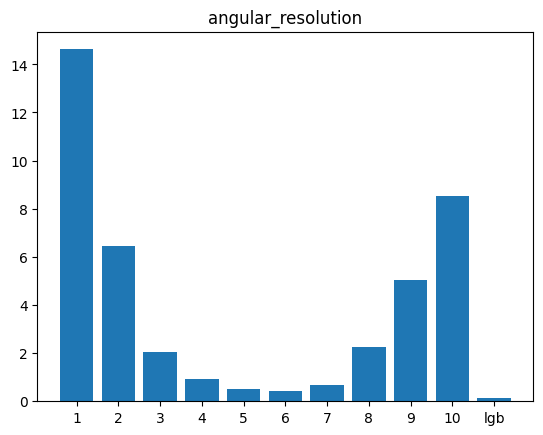

[49.12641915549656, 25.837497044835278, 17.282735750075553, 13.62717427847473, 11.788317658959857, 11.272505650186424, 11.120905861898104, 11.88546534411899, 15.69223103316982, 33.80573727003078, 5.023059340051545]


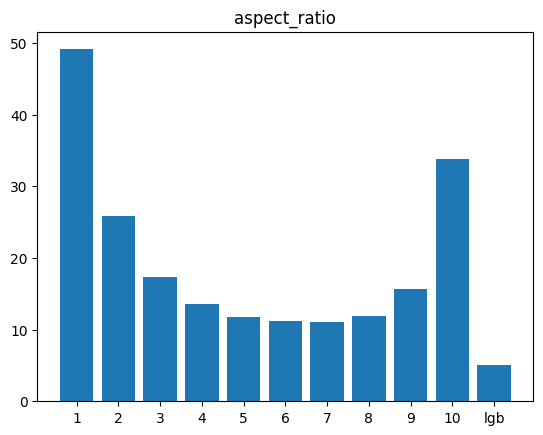

[11.741434505042994, 5.021881304957354, 2.2993058615668946, 1.5538819959250108, 1.2468644663466524, 1.120126219282862, 1.1884870984433857, 1.4791195835708442, 2.575903085229766, 7.4841710105634975, 0.8686593249722662]


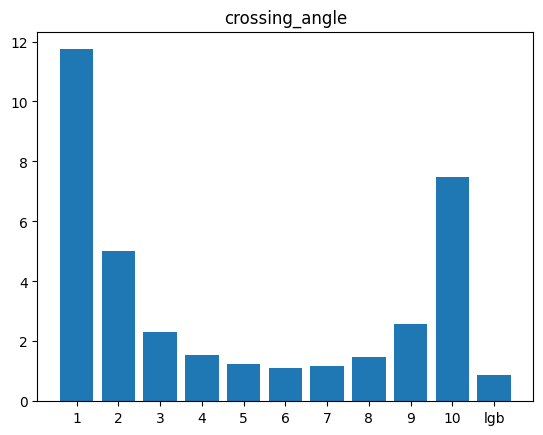

[11.802207730465044, 5.057068627271798, 2.170298515541538, 1.2971433826446448, 0.9246238523792021, 0.783903416957671, 0.8781799965228827, 1.5458574290634743, 3.0409668772177945, 7.1551941166016455, 0.5427999440098848]


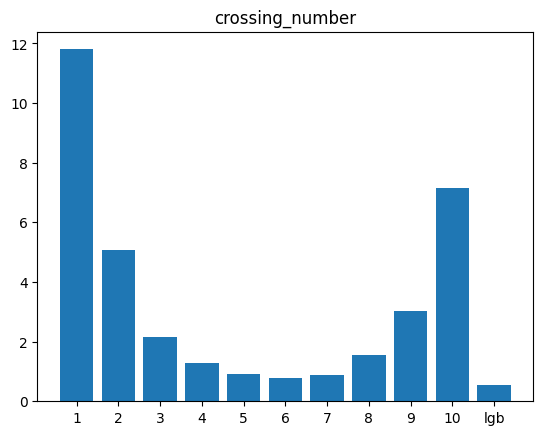

[27.21831010817163, 10.193136431556807, 4.027064858132361, 5.21804616575186, 5.263971761053237, 5.318638703130789, 4.371915809558641, 2.8196643787265505, 4.657506071971735, 14.09130458763761, 1.5867248415768704]


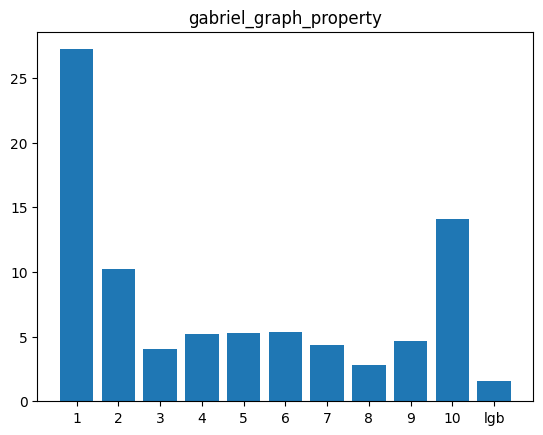

[55.356969412523306, 21.428986371624937, 6.436133160052635, 4.9907366673217926, 4.791706085467051, 5.118214841775276, 4.514454832826052, 4.212345477032809, 9.653295401745666, 29.953177895071473, 2.710516165875344]


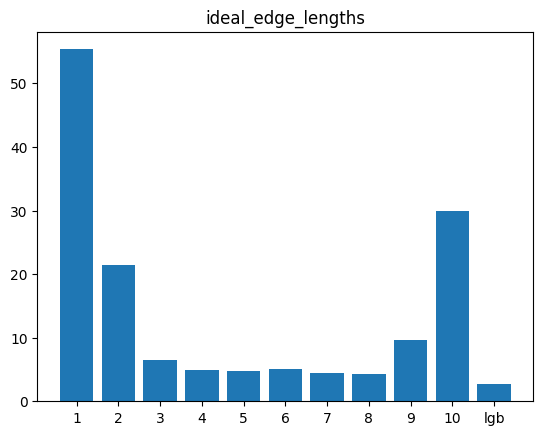

[438.8165297907375, 165.5283540199226, 77.70339111154826, 45.38933201714952, 32.48666004555668, 28.720358736077337, 28.913121535625372, 34.57954803952398, 62.550107847865824, 272.5200728120324, 8.54817334874557]


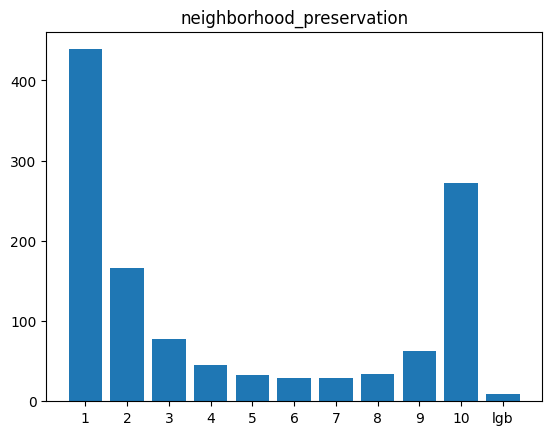

[3.6227299595011613, 2.3876794015006406, 1.8969275334790263, 1.7910647760181737, 1.8196211196338332, 1.6285730822164175, 1.7237521888312624, 1.8000120440725247, 1.9825886696294237, 2.823843955973203, 0.783436394821537]


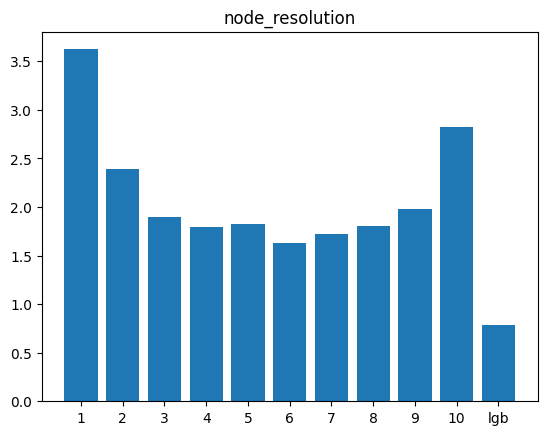

[16.85684451893675, 8.856581148749271, 4.68940333844565, 3.755005969771907, 3.3211120385616706, 3.2867653460660953, 3.029516329892292, 2.762149657190343, 4.01984324059866, 11.198853419143898, 1.3361221227655455]


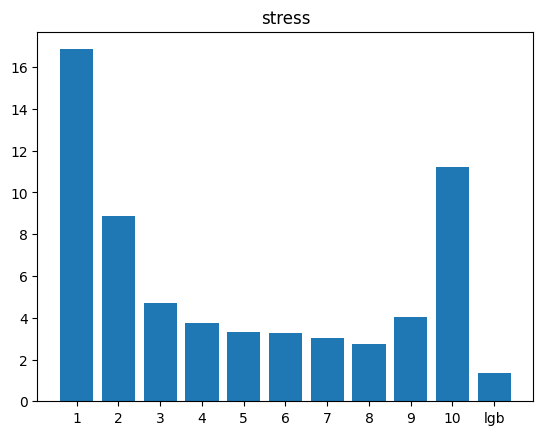

[15.683970247748698, 6.943609630112296, 2.092184525644172, 0.814039642041267, 0.387575793312563, 0.28915405164713887, 0.5526230547048022, 2.219354815409174, 5.10395252207338, 9.338236464511768, 0.126229028687687]


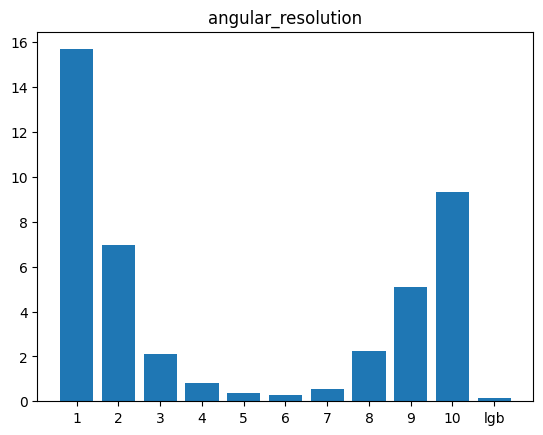

[80.3793766193283, 35.56275770119736, 19.174934167085524, 13.042416972318033, 9.952947633241472, 8.650941975444356, 8.899958103578992, 10.324316045398872, 17.846837132886435, 53.77295064025085, 5.023002850035659]


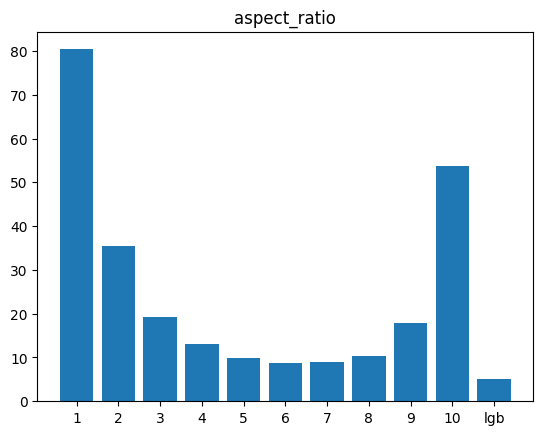

[18.294105399521847, 7.5259831041226235, 2.911360418842751, 1.481838563536724, 0.9829799111936441, 0.9077968769957431, 0.9581255223896469, 1.3577196956890718, 3.057276509579293, 12.404059264475778, 0.8686364934878695]


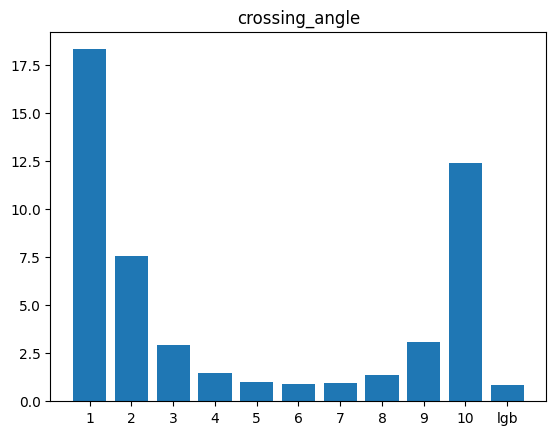

[16.165846768962272, 6.951540796489912, 2.5416553770579853, 1.1389357308319195, 0.6812735474575887, 0.5611949028601922, 0.6750374725464658, 1.4813885805867582, 3.395738009322408, 10.761837259851951, 0.5427844364410338]


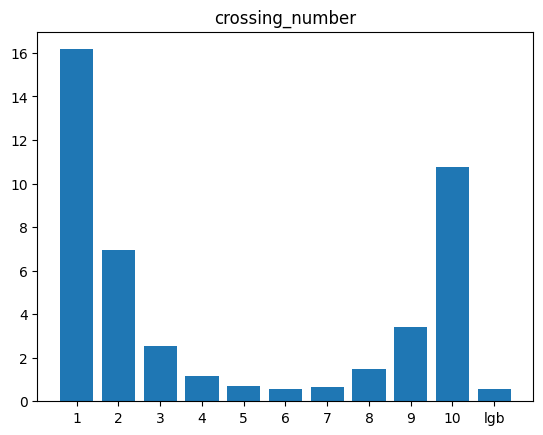

[38.050710176935205, 15.303990554175938, 4.810876690947952, 3.2043783150328373, 2.9869014487423478, 3.027663988521083, 2.79426980297368, 2.4674799838709265, 5.013035465607874, 21.419630352765992, 1.5866131143648927]


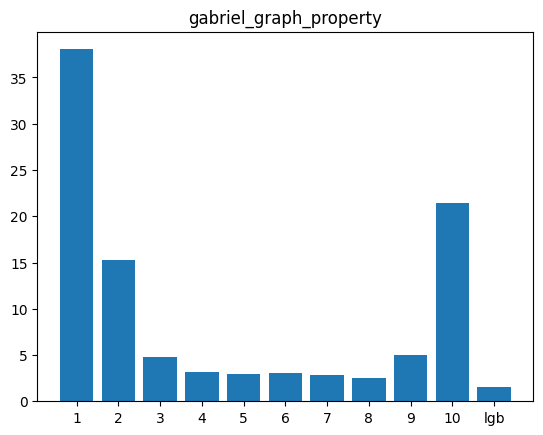

[75.3377144909526, 31.86304515515006, 8.833807345493943, 3.4892599214792965, 2.6142397216859123, 3.242242596846174, 2.8738040605702966, 3.0096526221073514, 10.013322859026186, 45.13805027757591, 2.7103451179604794]


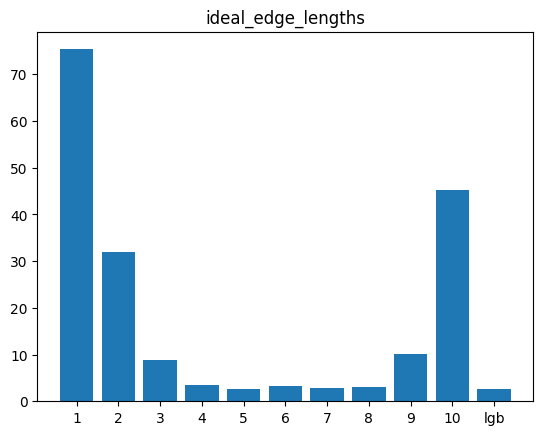

[830.1436608539391, 286.90182565491205, 109.76378506311381, 49.276967379060764, 27.70290127193927, 22.200667675005654, 21.91462610830988, 29.68187131226165, 86.75649818629819, 505.7822088050521, 8.547794310663052]


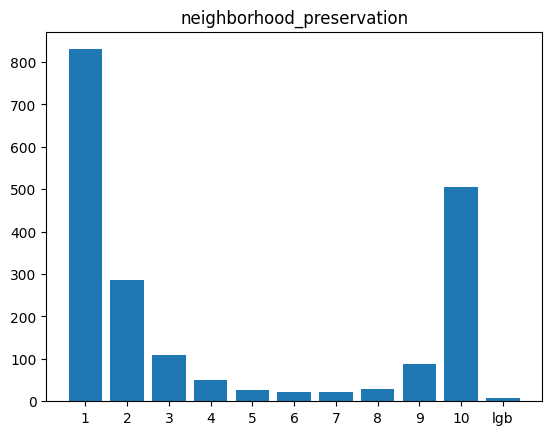

[4.451950026984636, 2.3956481154475195, 1.5701024968539832, 1.4353585689940087, 1.4553549291853976, 1.3404243237325753, 1.457189816590254, 1.481974733723254, 1.685611274867269, 3.2112022057230143, 0.7834304356481572]


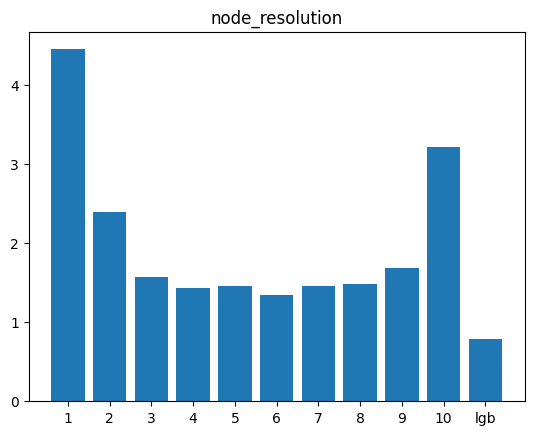

[27.65024017035996, 13.473495063780822, 5.877908463120302, 3.374652609004646, 2.244488852908366, 2.1397469525508686, 2.1478515858465896, 2.3269390230198272, 4.720153165939559, 18.537307120331484, 1.336083164410318]


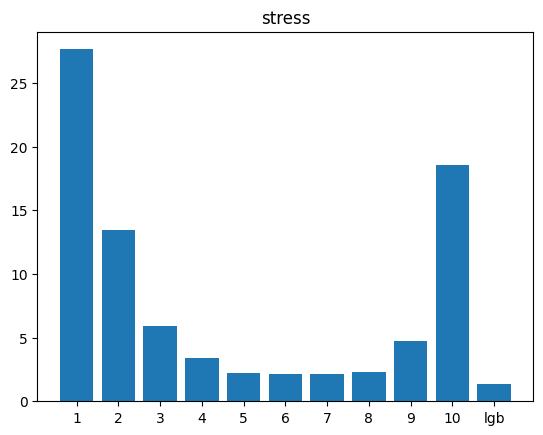

[13.569230856891423, 5.994202785909447, 2.0393173732153835, 1.0312154101418036, 0.6495570352236969, 0.5665998428989629, 0.7889058271175031, 2.330016190913157, 4.9817848163545575, 7.719965554258017, 0.126237509081192]


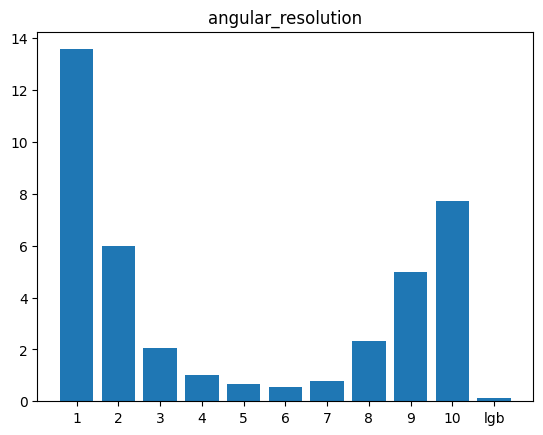

[17.873461691664726, 16.11223638847319, 15.390537333065572, 14.211931584631412, 13.62368768467825, 13.894069324928488, 13.341853620217208, 13.446614642839108, 13.53762493345321, 13.838523899810632, 5.023115830067432]


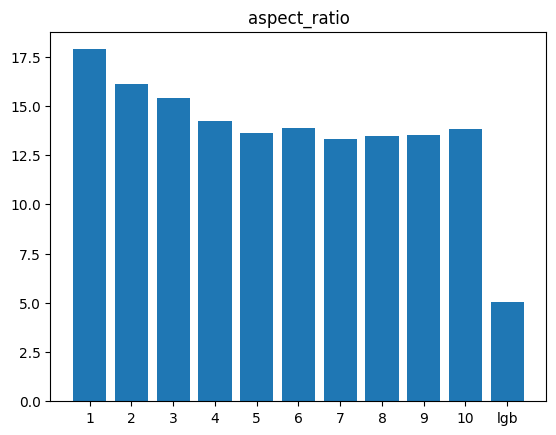

[5.1887636105641315, 2.5177795057920926, 1.687251304291039, 1.625925428313295, 1.510749021499661, 1.332455561569981, 1.4188486744971252, 1.6005194714526159, 2.094529660880239, 2.5642827566512096, 0.8686821564566635]


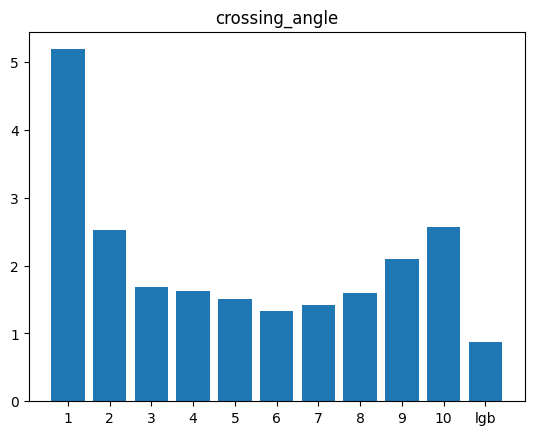

[7.438568691967816, 3.1625964580536845, 1.7989416540250898, 1.4553510344573684, 1.1679741573008147, 1.0066119310551496, 1.0813225204992996, 1.6103262775401905, 2.68619574511318, 3.5485509733513467, 0.5428154515787366]


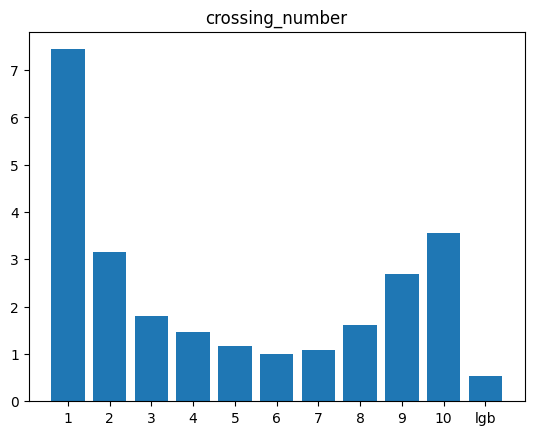

[16.385910039408024, 5.082282308937703, 3.2432530253167706, 7.231714016470879, 7.541042073364127, 7.60961341774049, 5.9495618161436, 3.171848773582173, 4.301976678335591, 6.762978822509253, 1.5868365687888473]


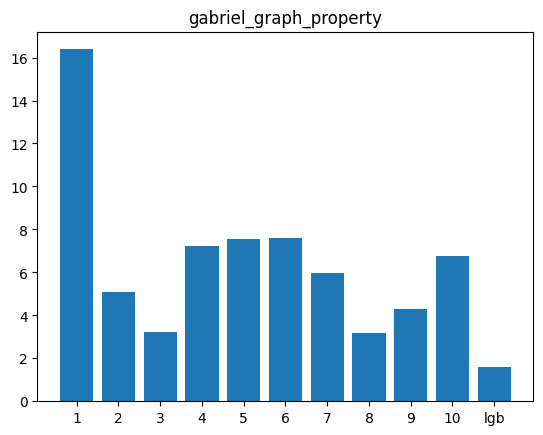

[35.37622433409401, 10.994927588099815, 4.038458974611336, 6.492213413164289, 6.96917244924819, 6.994187086704383, 6.155105605081805, 5.415038331958262, 9.293267944465132, 14.768305512567075, 2.7106872137902105]


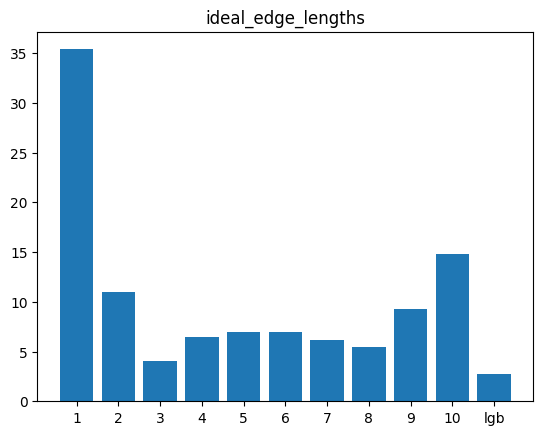

[47.48939872753526, 44.154882384933515, 45.64299715998269, 41.501696655238206, 37.27041881917406, 35.24004979714903, 35.91161696294086, 39.4772247667863, 38.34371750943347, 39.257936819012464, 8.548552386828106]


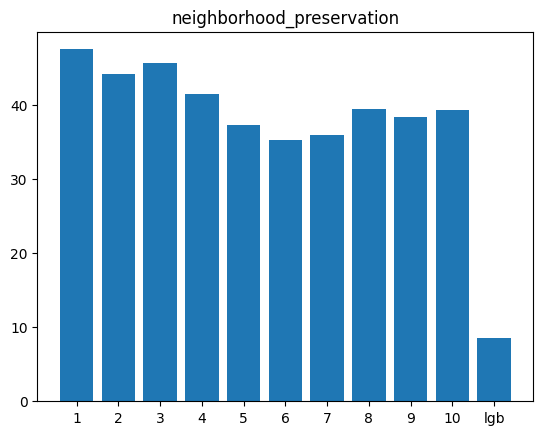

[2.793509892017695, 2.379710687553762, 2.2237525701040686, 2.146770983042339, 2.18388731008227, 1.9167218407002593, 1.9903145610722714, 2.1180493544217907, 2.2795660643915783, 2.436485706223393, 0.7834423539949168]


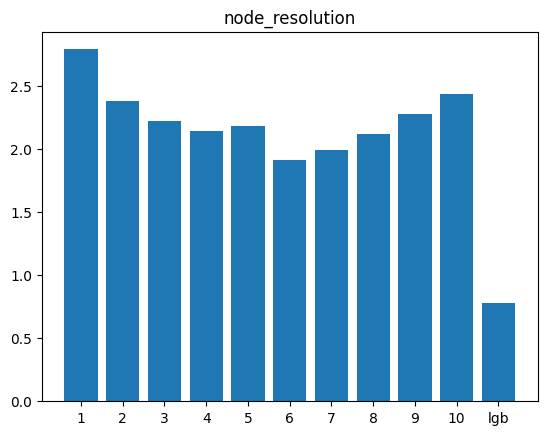

[6.063448867513523, 4.2396672337177055, 3.5008982137709905, 4.135359330539165, 4.397735224214975, 4.433783739581323, 3.9111810739379953, 3.197360291360858, 3.3195333152577597, 3.8603997179563385, 1.3361610811207731]


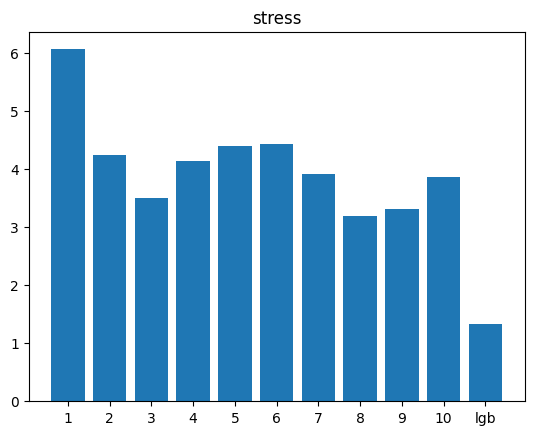

In [11]:
import matplotlib.pyplot as plt

for i in range(3):
    bd = {}
    for qm_name in qm_names:
        bd[qm_name] = []
    for s in ss:
        for qm_name in qm_names:
            bd[qm_name].append(s[qm_name][i])

    for qm_name in qm_names:
        print(bd[qm_name])
        plt.title(qm_name)
        # plt.bar(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', 'lgb'],bd[qm_name] )
        plt.bar([str(l) for l in degs] + ['lgb'],bd[qm_name] )
        plt.show()

In [12]:
cs

[('eps', 'number_of_iterations'),
 ('eps', 'number_of_pivots'),
 ('number_of_iterations', 'number_of_pivots')]

In [ ]:
!say hello
!say hello
!say hello

1
sort 0.0697405650280416


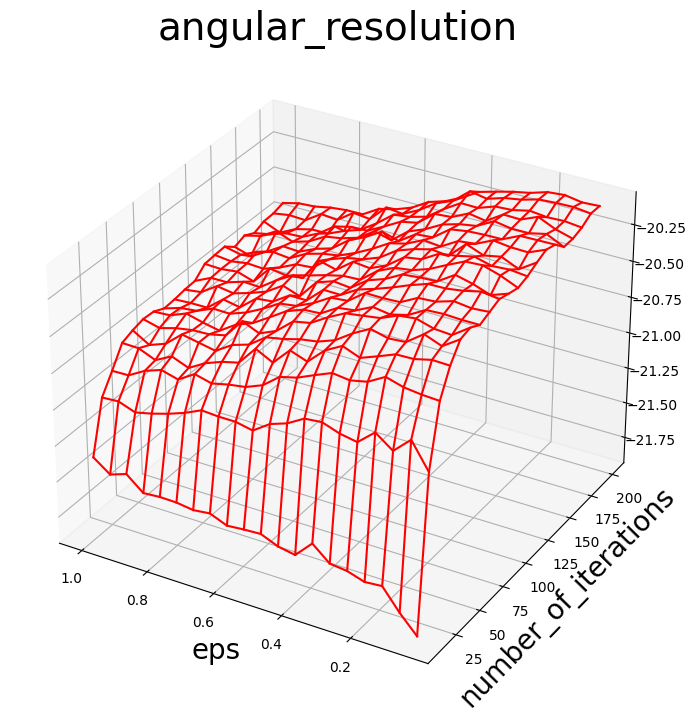

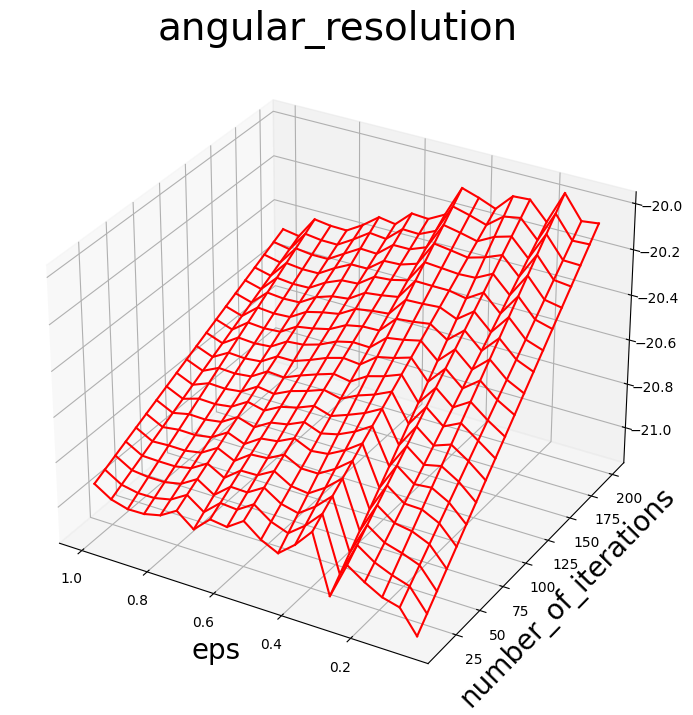

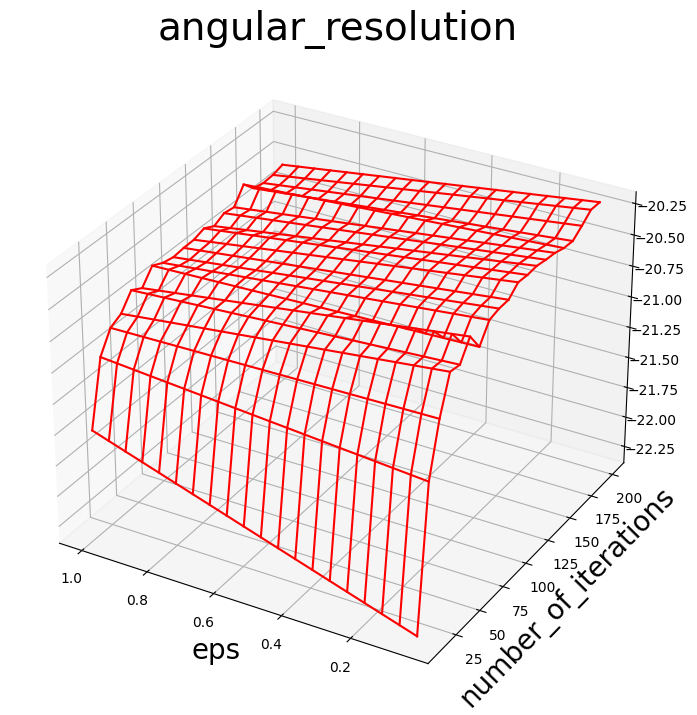

2
sort 0.07732615992426872


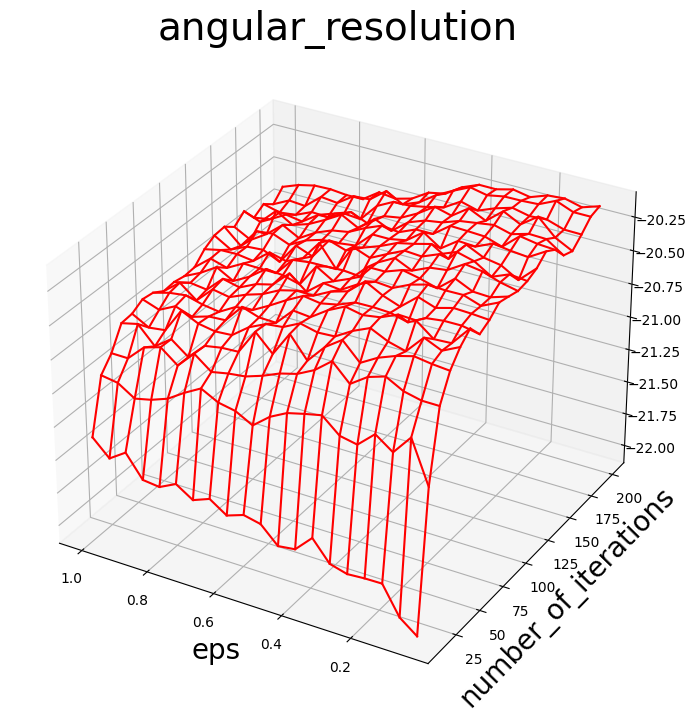

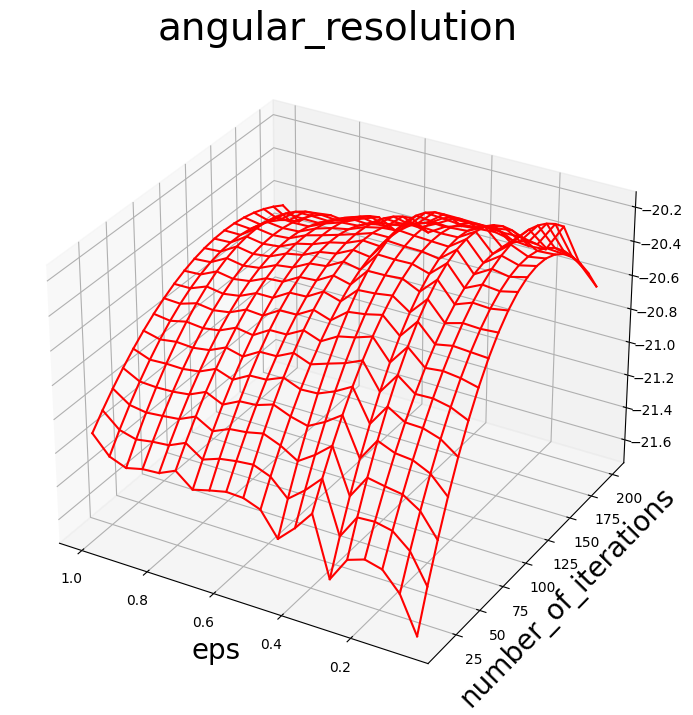

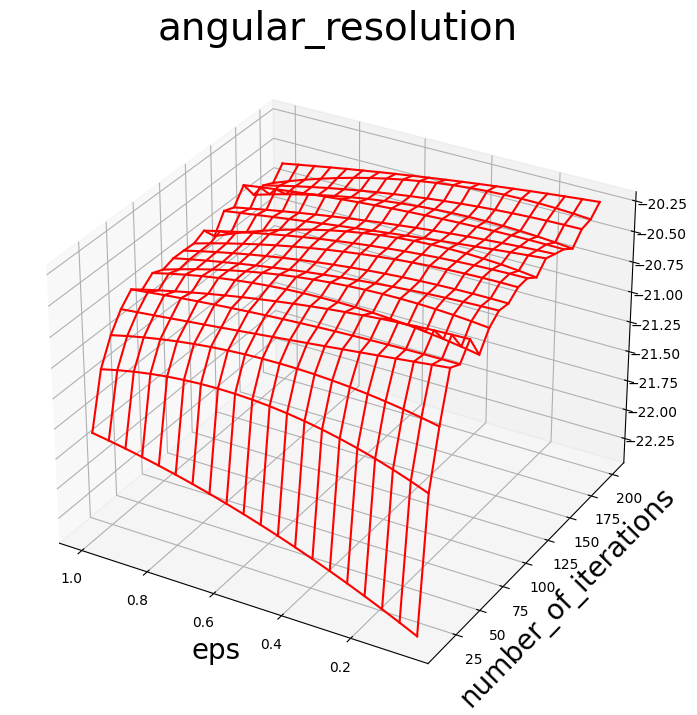

3
sort 0.07657440996263176


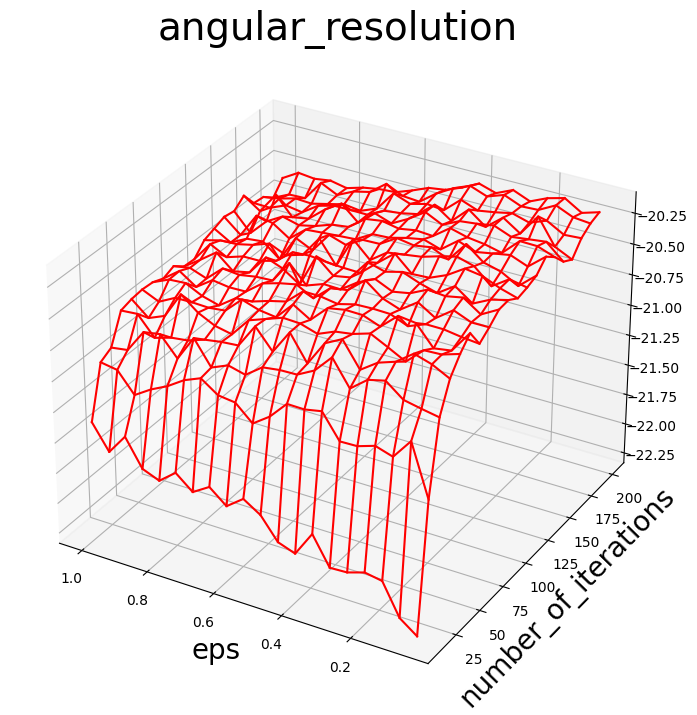

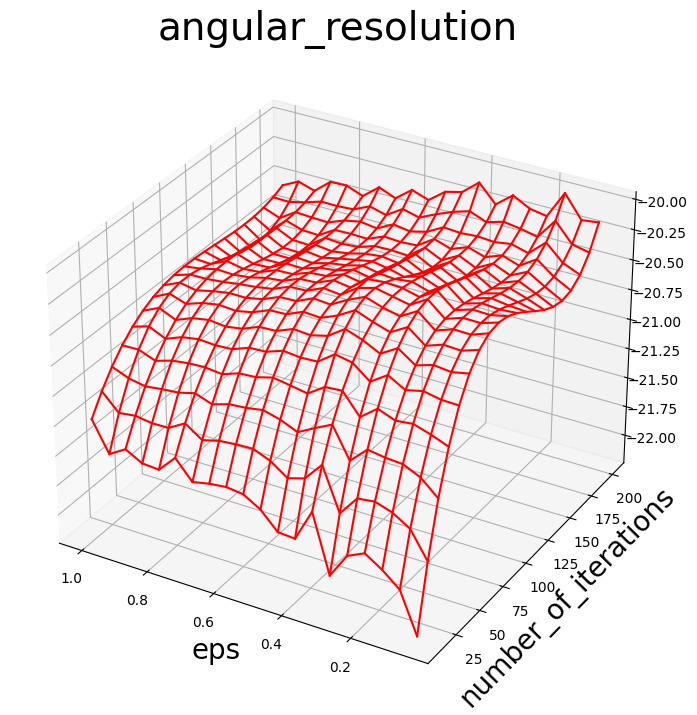

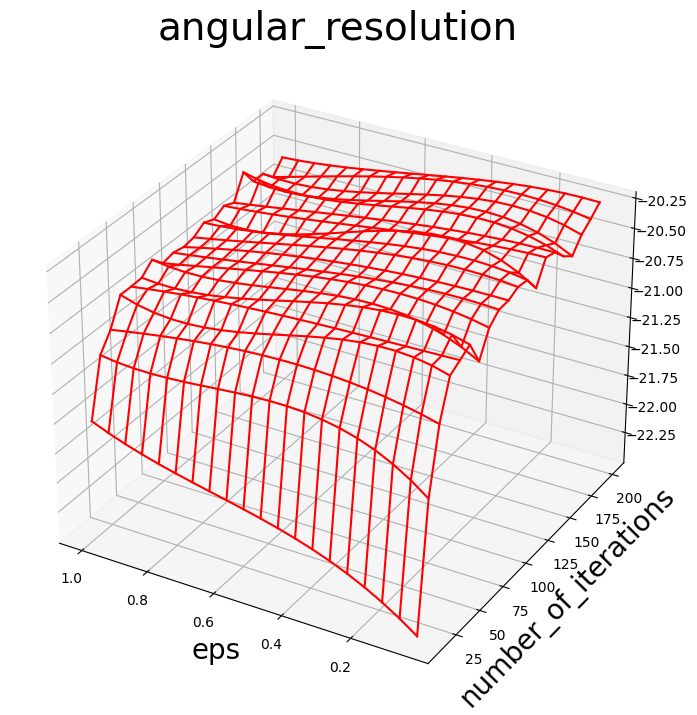

4
sort 0.0729490879457444


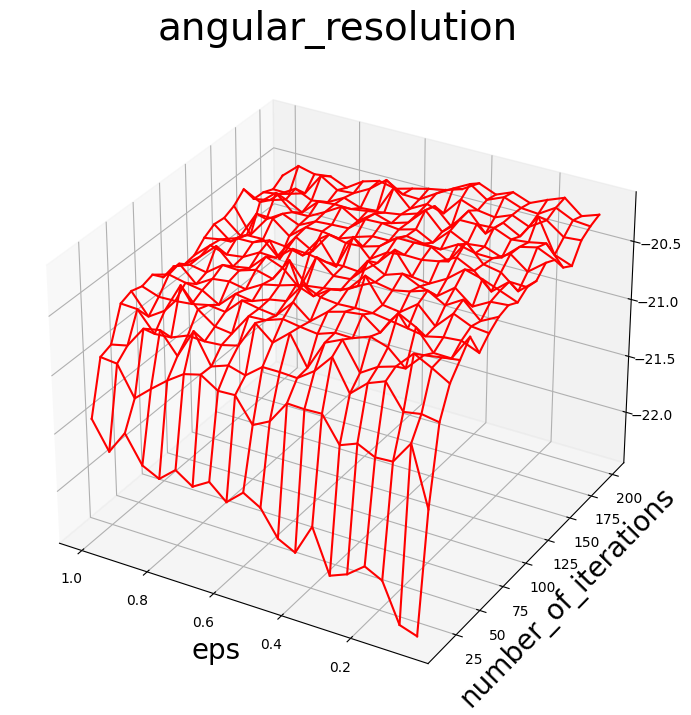

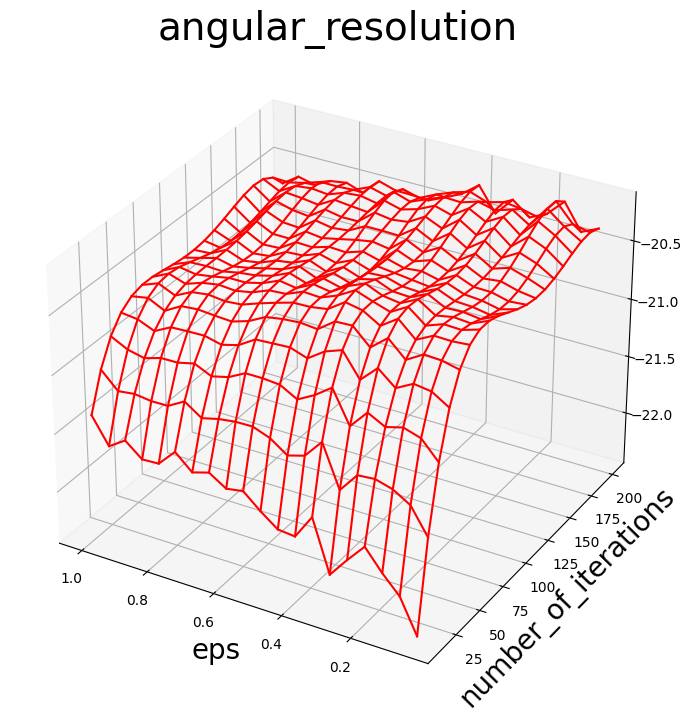

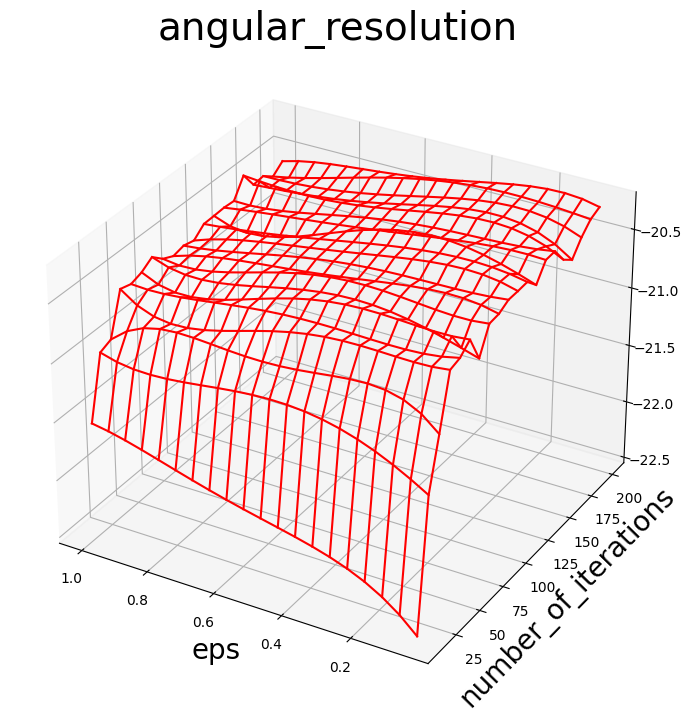

5
sort 0.0753880039555952


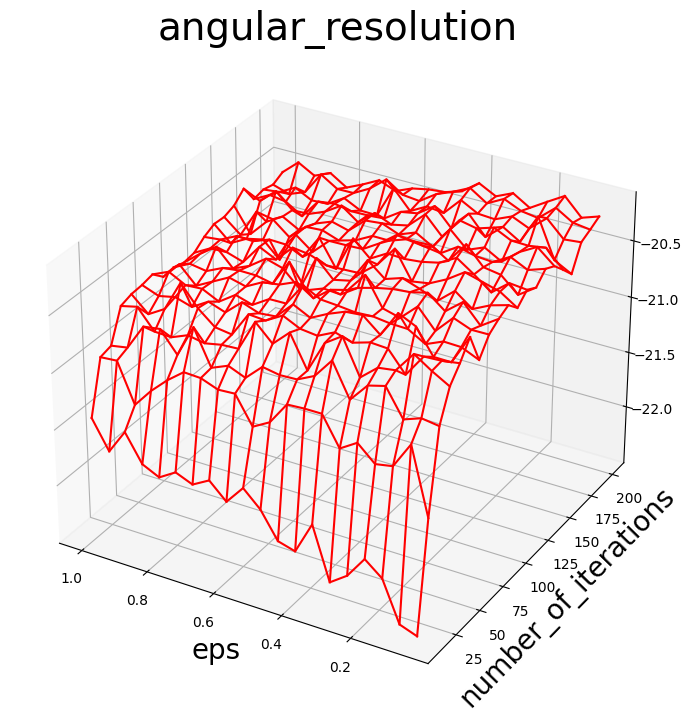

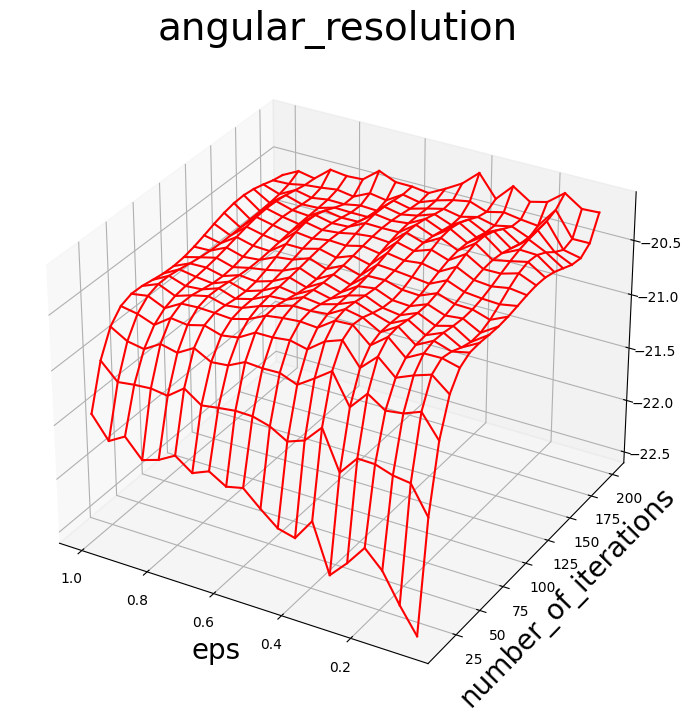

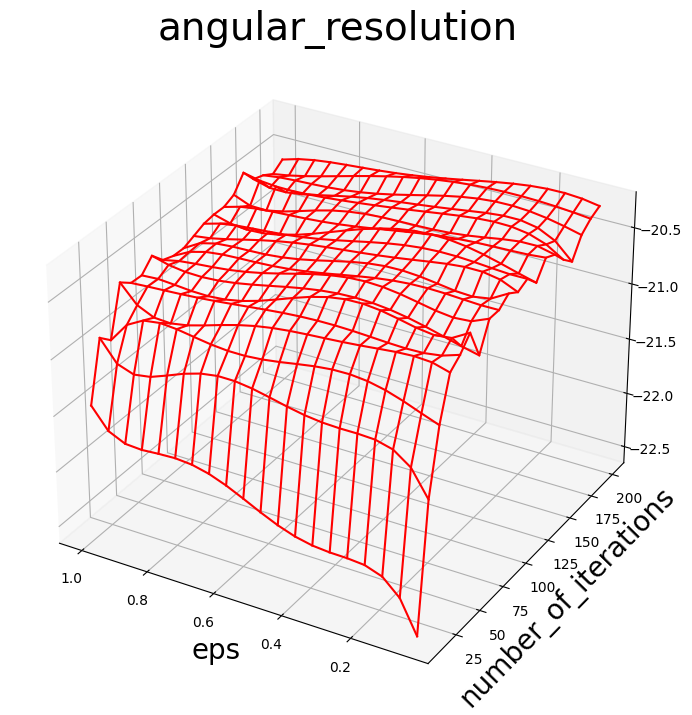

6
sort 0.12634456995874643


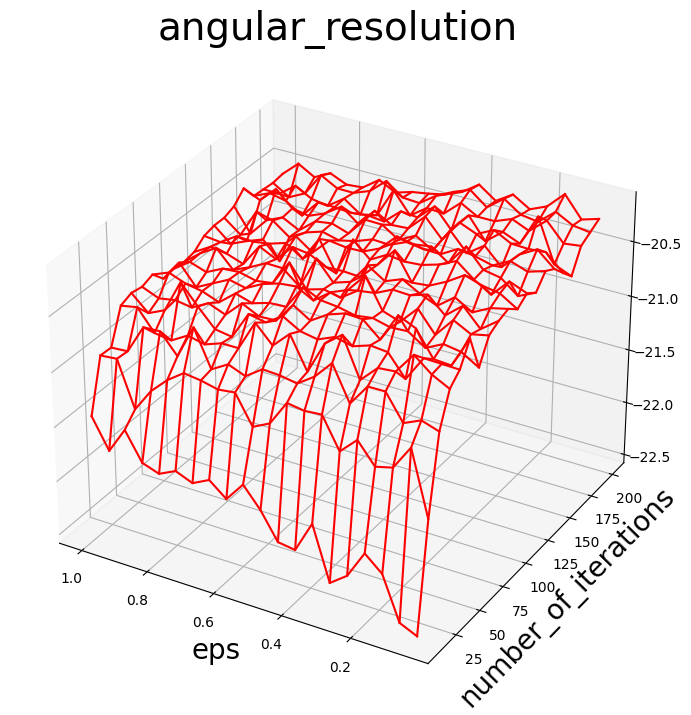

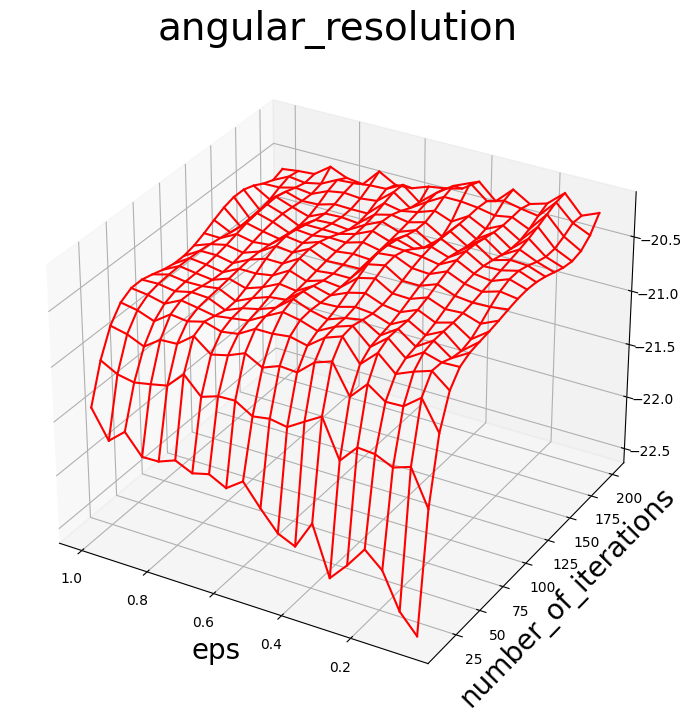

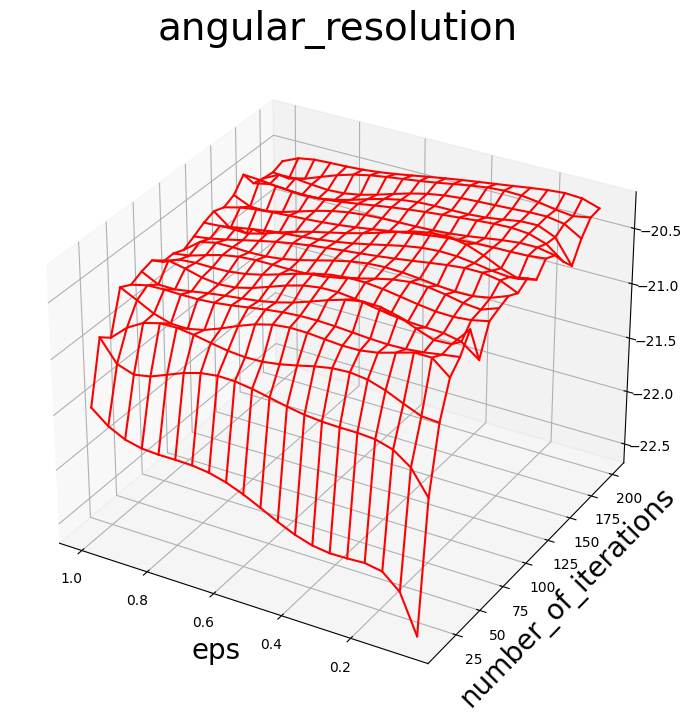

7
sort 0.0718937530182302


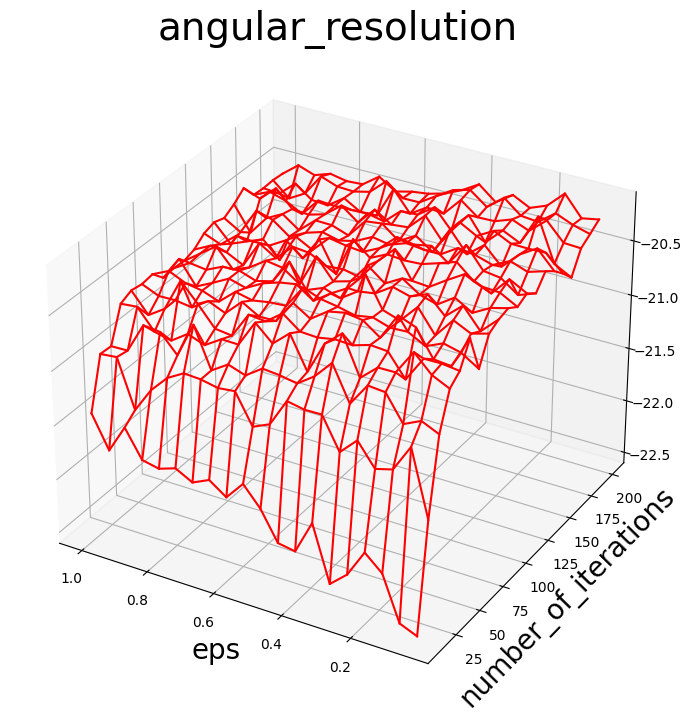

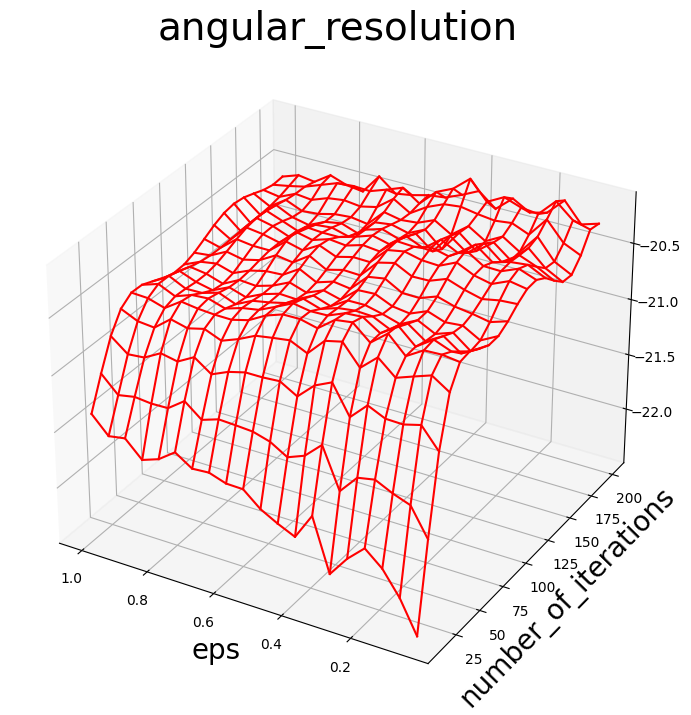

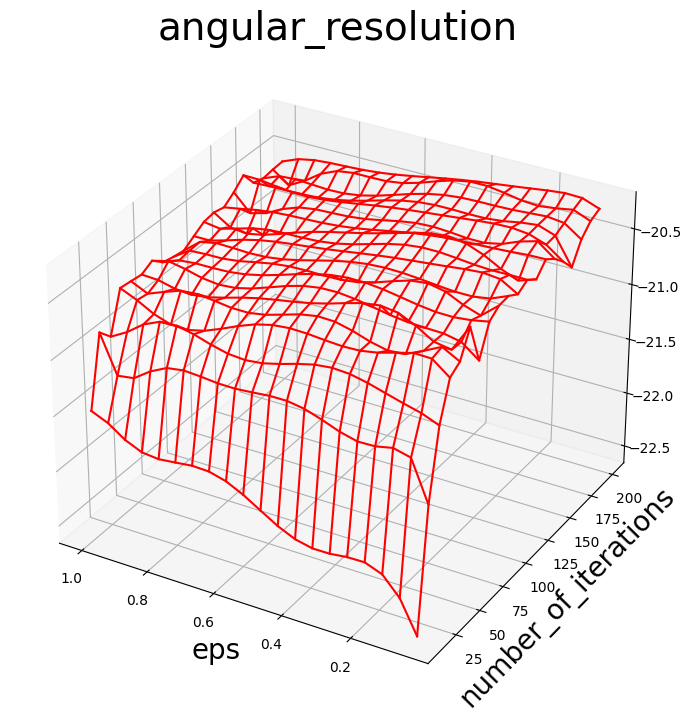

8
sort 0.0705889369128272


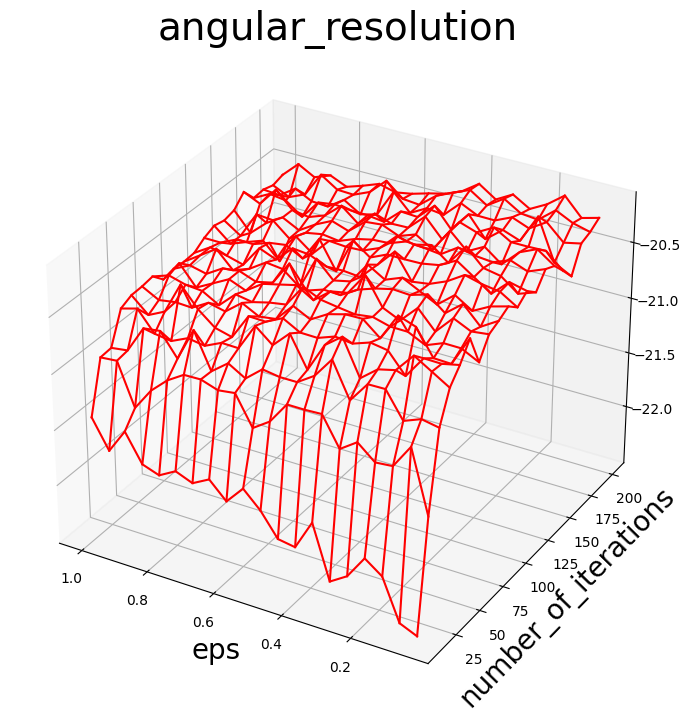

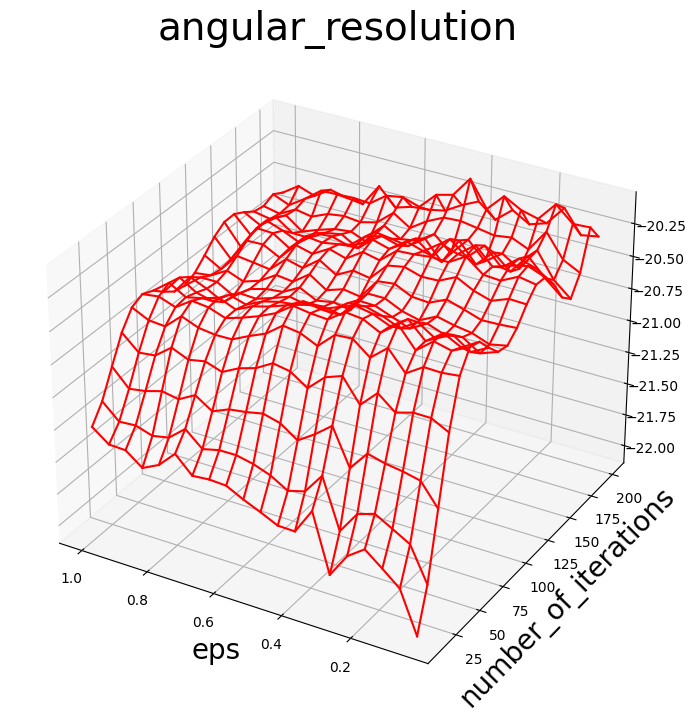

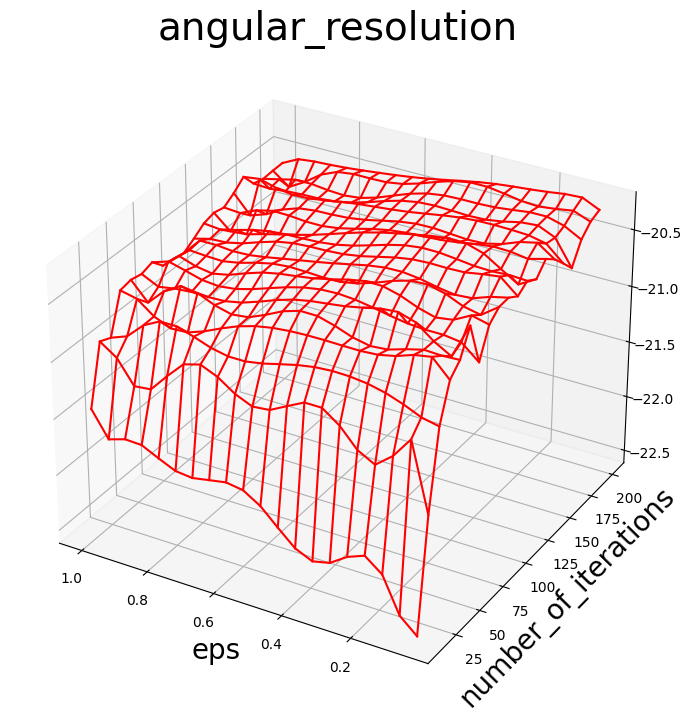

9
sort 0.0737845340045169


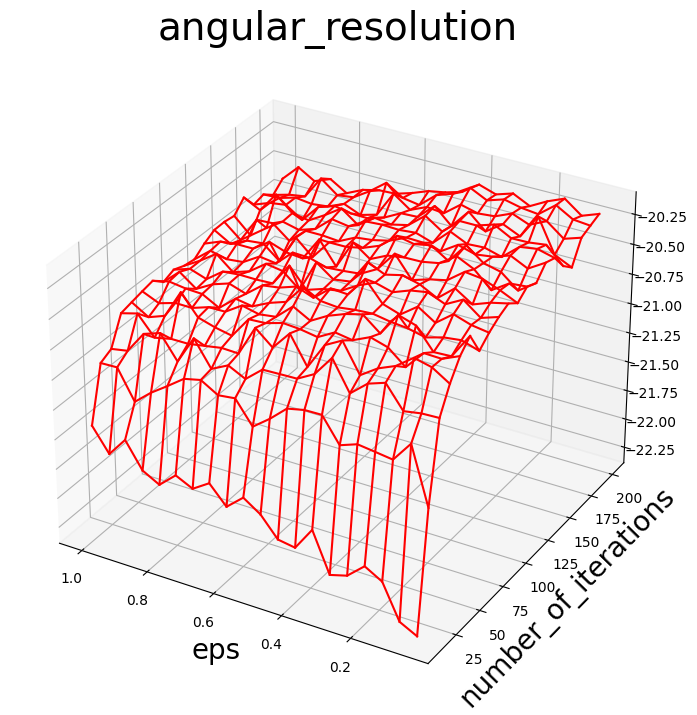

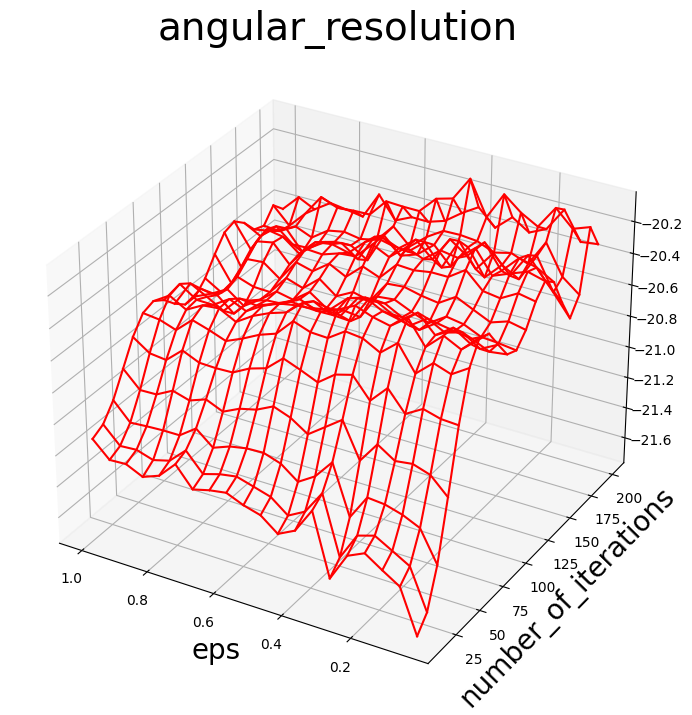

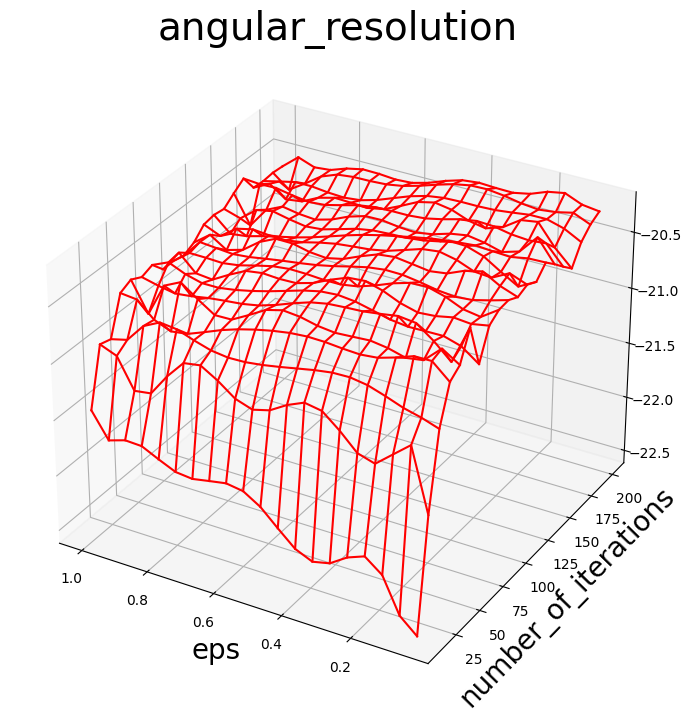

10
sort 0.08559709799010307


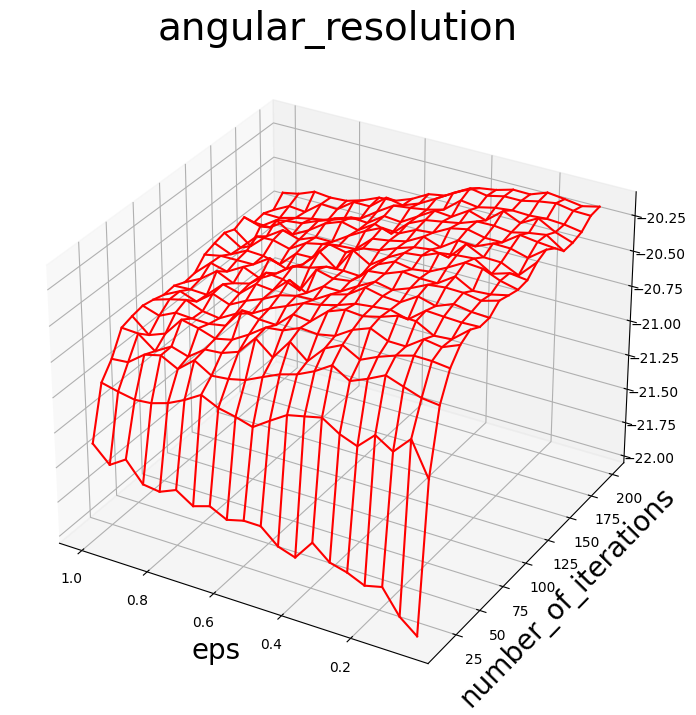

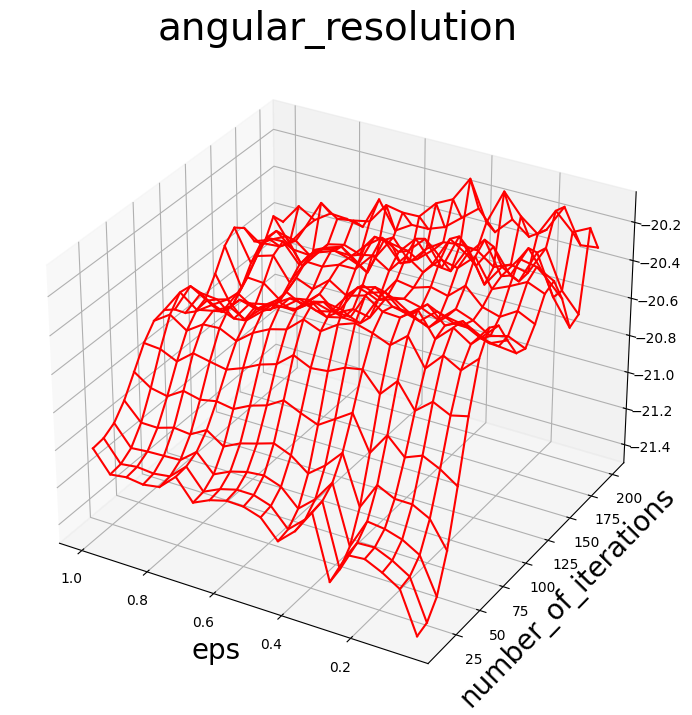

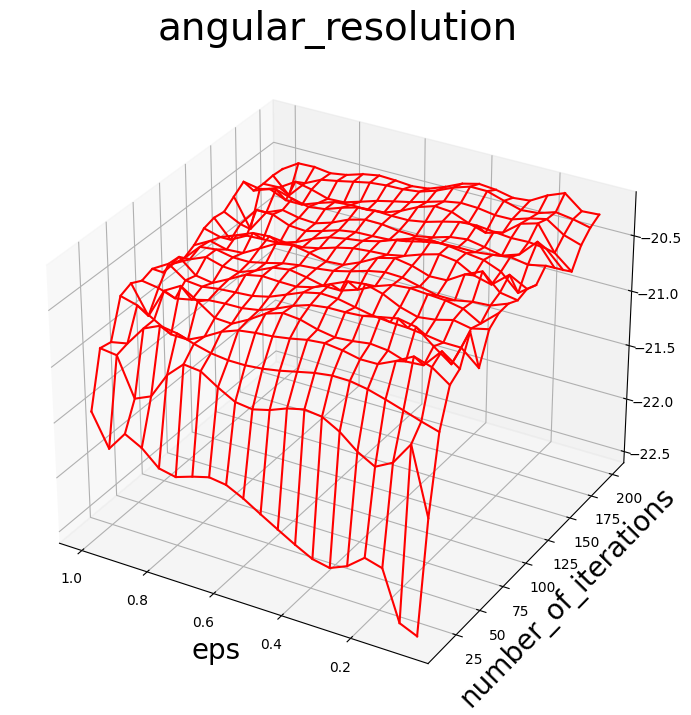

In [15]:
# 関数の形を見るためのやつ


from sklearn.model_selection import train_test_split
from tqdm import tqdm
from itertools import combinations
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score
from time import perf_counter


cs = list(combinations(params_names, 2))
degs = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
# degs = [5]

models = [
    {
        "model_df": pd.read_pickle(
            root_path.joinpath(
                f"data/experiments/regression_analysis/grid/grid_models_poly_{deg}.pkl"
            )
        ),
        "name": deg,
    }
    for deg in degs
]
# models.append(
#     {
#         "model_df": pd.read_pickle(
#             root_path.joinpath(
#                 f"data/experiments/regression_analysis/grid/grid_models_lightgbm.pkl"
#             )
#         ),
#         "name": "lgb",
#     }
# )

results = []
for model in models:
    print(model['name'])
    result_array = []

    # for c in tqdm(cs):
    for c in cs:
        start = perf_counter()
        pa = c[0]
        pb = c[1]
        pt = list(filter(lambda x: x != pa and x != pb, params_names))[0]

        # pavs = sorted(list(set(data[pa])))[::5]
        # pbvs = sorted(list(set(data[pb])))[::5]
        # ptvs = sorted(list(set(data[pt])))[::5]
        pavs = sorted(list(set(data[pa])))
        pbvs = sorted(list(set(data[pb])))
        ptvs = sorted(list(set(data[pt])))

        print('sort', perf_counter() - start)

        for qm_name in qm_names:
            for ptv in ptvs:
                df_data = []
                for pav in pavs:
                    for pbv in pbvs:
                        result = {}
                        result[pa] = pav
                        result[pb] = pbv
                        result[pt] = ptv

                        result[qm_name] = regression_func(
                            [
                                [pa, pav],
                                [pb, pbv],
                                [pt, ptv],
                            ],
                            qm_name=qm_name,
                            model_df=model["model_df"],
                        )
                        # l = data.query(
                        #     f"{pa} == {pav} & {pb} == {pbv} & {pt} == {ptv}"
                        # )

                        # result[f"{qm_name}_test_labels"] = list(
                        #     l[f"{qm_name}_ss"].values
                        # )

                        result_array.append(result)
                        df_data.append(result)
                df = pd.DataFrame(df_data)
                for i in range(3):
                    # i=0
                    fig = plt.figure(figsize=(8, 8))
                    axis = fig.add_subplot(111, projection="3d")
                    fig.subplots_adjust(right=1, top=0.93)
                    axis.set_title(f"{qm_name}", fontsize=28)
                    axis.set_xlabel(pa, fontsize=20)
                    axis.set_ylabel(pb, fontsize=20)
                    axis.invert_xaxis()
                    for pbv in pbvs:
                        pdf = df.query(f"{pb} == {pbv} & {pt} == {ptv}")
                        axis.plot(pdf[pa], pdf[pb], [v[i] for v in pdf[qm_name]], color='red')
                    for pav in pavs:
                        pdf = df.query(f"{pa} == {pav} & {pt} == {ptv}")
                        axis.plot(pdf[pa], pdf[pb], [v[i] for v in pdf[qm_name]], color='red')
                    plt.show()
                break
            break

        break

    result = pd.DataFrame(result_array)
    results.append(result)